# **Understanding Of A Telecom Industry Customer Churn**

In any business sector, high rates of customer attrition are a significant issue, but this concern is particularly acute in the telecommunications field. The financial impact of losing customers is substantial for these companies, which is why there's a growing interest in creating predictive models for identifying potential churn risks. The telecom market is fiercely competitive, with an average annual turnover rate ranging between 15-25%. Moreover, it's far more cost-effective to maintain current clientele than to attract new customers, amplifying the focus on customer retention strategies over acquisition.

Consequently, our project aims to identify the contributing factors that lead to customer departure, so as to help telecom providers take preventive measures. The ultimate objective is to aid these operators in pinpointing those customers who are at the highest risk of leaving, thereby enabling them to implement targeted retention initiatives for their most valued customers.

# **Business Objective**

*   Maximize: Company's profit by retaining customer
*   Minimize: Customer churn by identifying the key cause of the problem

# **Primary Aim of the Project Is To**

* Identifying the elements and reasons that prompt customer attrition.
* Taking targeted measures to maintain customers who are at risk of leaving.
* Tailoring promotional incentives based on the factors that impact customer retention.

# **Develop Machine Learning Model**

To kick off the Machine Learning process, our first step involves preparing the data set for training. This is a crucial stage where we clean, transform, and organize our raw data into a format that can be effectively ingested by Machine Learning algorithms. Data Preparation may include tasks such as handling missing or imbalanced data, encoding categorical variables, feature scaling, and splitting the data into training and testing sets. By carefully preparing the data, we aim to enhance the predictive accuracy of our Machine Learning models while reducing the likelihood of errors.

* We initiate the project by incorporating the crucial machine learning libraries into our coding workspace.

In [1]:
# Data Handling and Visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Model Building
from sklearn.neural_network import MLPClassifier

# Model Evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV

# Cross-validation
from sklearn.model_selection import cross_val_score

# To handle imbalance (if needed)
from imblearn.over_sampling import SMOTE

* We subsequently import the 'drive' module into our notebook. This allows us to access and read the dataset stored in our cloud-based storage solution.

In [ ]:
#mount the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


* Once the drive has been successfully mounted, we proceed to load our dataset into a DataFrame for further analysis.






In [ ]:
import pandas as pd

# Load the data into a DataFrame
df = pd.read_csv('/content/drive/My Drive/train.csv')

# **Data Preparation**

* Subsequently, we imported the dataset into our machine learning workspace with the intention of training our predictive model.

In [ ]:
# Load the Data for Training Machine Learning Model
df_train = pd.read_csv('/content/drive/My Drive/train.csv')

df_train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


# **Data Cleaning**

Conducting data analysis involves pinpointing and dealing with missing values through techniques like value imputation or eradicating incomplete data rows. In addition, efficiently resolving matters connected to redundant data or duplicate records is crucial. Key motivations for the necessity of data cleaning include:

**Handling Missing Values:** Incomplete data can skew the model's understanding and result in inaccurate predictions. Handling missing values appropriately is essential for building a reliable model.

**Noise Reduction:** Raw data often contain noise or outliers that can negatively impact the model's performance. Cleaning helps to eliminate or minimize these issues.

**Data Consistency:** Inconsistencies in the data can arise due to various factors like data entry errors, multiple data sources, or data duplication. Ensuring consistency is vital for the model to learn the correct patterns.

**Feature Engineering:** During data cleaning, new features can be engineered from the existing ones, and irrelevant features can be dropped, making the model more efficient.

**Normalization and Standardization:** Datasets often contain features that are measured in different units, and that can vary in ranges. Normalizing or standardizing these features is important for algorithms sensitive to feature scales.

**Data Transformation:** Certain machine learning algorithms make specific assumptions about how data are distributed. Data cleaning allows us to transform the data to meet these assumptions, enabling the algorithm to learn more effectively.

**Handling Categorical Data:** Machine learning models require numerical input, so categorical variables should be encoded to numerical values. This is another form of data cleaning.

**Improving Model Accuracy:** Ultimately, cleaner data leads to more accurate models, which is often the primary objective of machine learning projects.

**Reducing Overfitting:** Cleaner data that accurately represents the underlying structure can also help in reducing model overfitting.

By performing data cleaning, you ensure that your machine learning model is learning from a dataset that is as accurate and as representative of the real-world scenario as possible.

In [ ]:
# check duplicated data
print('Duplicated Data :', df_train.duplicated().sum())

# check missing value
print('Missing Value :\n', df_train.isnull().sum())

Duplicated Data : 0
Missing Value :
 state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64


# **Data Exploration**

Data exploration helps you understand the quality and structure of your dataset, allowing you to make informed decisions on preprocessing and modeling. Below are some of the things you might want to do during this phase:

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is called df
# Replace 'df' with the name of your DataFrame

# Check shape
print("Shape of the Data:", df.shape)

# Summary statistics
print("Summary Statistics:")
print(df.describe())

# Check for missing values
print("Missing Values:")
print(df.isna().sum())



Shape of the Data: (4250, 20)
Summary Statistics:
       account_length  number_vmail_messages  total_day_minutes  \
count     4250.000000            4250.000000        4250.000000   
mean       100.236235               7.631765         180.259600   
std         39.698401              13.439882          54.012373   
min          1.000000               0.000000           0.000000   
25%         73.000000               0.000000         143.325000   
50%        100.000000               0.000000         180.450000   
75%        127.000000              16.000000         216.200000   
max        243.000000              52.000000         351.500000   

       total_day_calls  total_day_charge  total_eve_minutes  total_eve_calls  \
count      4250.000000       4250.000000        4250.000000      4250.000000   
mean         99.907294         30.644682         200.173906       100.176471   
std          19.850817          9.182096          50.249518        19.908591   
min           0.000000    

## **Data Correlation**

***Understanding Data Correlation***

**Values Range:** The values on a correlation heatmap typically range from -1 to 1. These are correlation coefficients.

1: A value of 1 (or close to 1) implies a strong positive correlation: as one variable increases, the other also tends to increase.
-1: A value of -1 (or close to -1) implies a strong negative correlation: as one variable increases, the other tends to decrease.
0: A value around 0 implies no correlation: changes in one variable do not predict changes in the other variable.

**Color Coding:** The colors represent the degree and direction of correlation. Commonly, warm colors like red or orange represent positive correlations and cool colors like blue represent negative correlations. The darker the color, the stronger the correlation.

<ipython-input-12-4cbf3be076c6>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_train.corr()


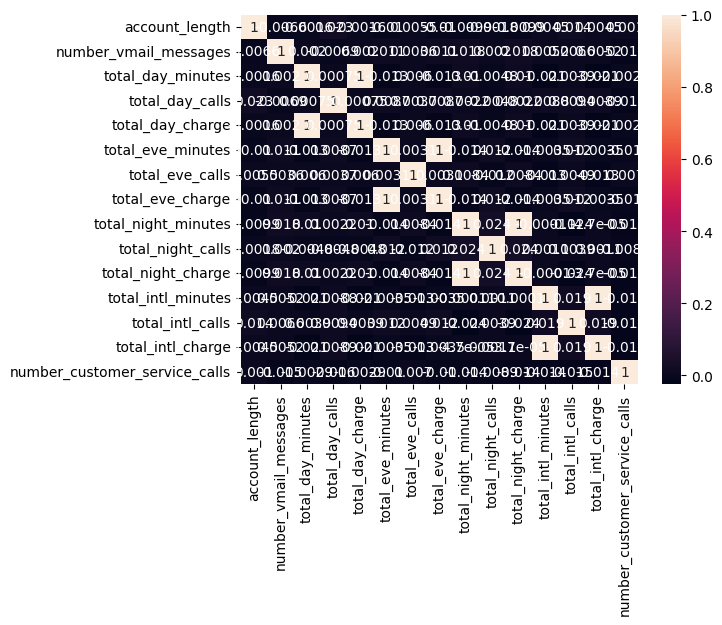

In [ ]:
import seaborn as sns

correlation_matrix = df_train.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()


<ipython-input-13-2822cc547f62>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_train.corr(),cmap='RdBu',vmin=-1,vmax=1)


<Axes: >

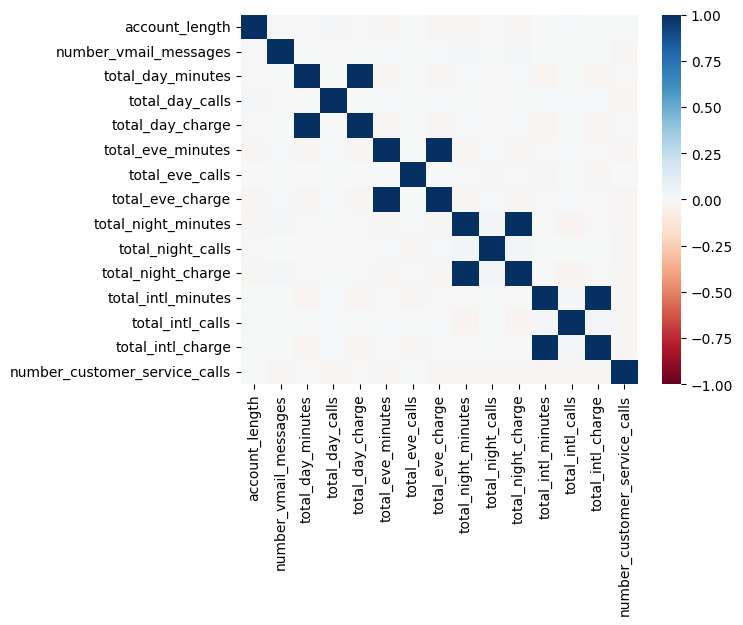

In [ ]:
# check the correlation between columns

sns.heatmap(df_train.corr(),cmap='RdBu',vmin=-1,vmax=1)

# **Exploratory Data Analysis (EDA)**

Exploratory Data Analysis (EDA) is an essential step in the data science process that involves visualizing, summarizing, and interpreting the information that is hidden in rows and columns of data. The primary goal of EDA is to understand the underlying structure of the data, identify anomalies, uncover relationships, and extract important variables that can better inform the modeling stage.

In our machine learning project, performing EDA is crucial for several reasons:

**Data Quality:** EDA helps us to identify and address issues in the dataset, such as missing values, outliers, and inconsistencies, that could otherwise negatively affect the performance of the machine learning model.

**Feature Selection:** By understanding the distribution of different variables and their relationship with the target variable, we can make more informed choices about which features to include in our machine learning model.

**Model Choice:** The insights gathered from EDA can also guide us in choosing the most appropriate machine learning algorithm for our data.

**Setting Benchmarks:** An initial understanding of data distribution helps us to set practical benchmarks for model performance, which can be useful in the evaluation stage.

By including EDA in our workflow, we lay a solid foundation for more complex data modeling tasks ahead, ensuring that our machine learning model has the best chance of providing reliable and accurate results.



In [ ]:
# check number of rows and columns of the data
df_train.shape

(4250, 20)

In [ ]:
# check the type of each columns
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [ ]:
# checking the statistical summary of the data
df_train.describe(include='all').T #(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
state,4250,51,WV,139,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account_length,4250.0,NaN,NaN,NaN,100.236235,39.698401,1.0,73.0,100.0,127.0,243.0
area_code,4250,3,area_code_415,2108,NaN,NaN,NaN,NaN,NaN,NaN,NaN
international_plan,4250,2,no,3854,NaN,NaN,NaN,NaN,NaN,NaN,NaN
voice_mail_plan,4250,2,no,3138,NaN,NaN,NaN,NaN,NaN,NaN,NaN
number_vmail_messages,4250.0,NaN,NaN,NaN,7.631765,13.439882,0.0,0.0,0.0,16.0,52.0
total_day_minutes,4250.0,NaN,NaN,NaN,180.2596,54.012373,0.0,143.325,180.45,216.2,351.5
total_day_calls,4250.0,NaN,NaN,NaN,99.907294,19.850817,0.0,87.0,100.0,113.0,165.0
total_day_charge,4250.0,NaN,NaN,NaN,30.644682,9.182096,0.0,24.365,30.68,36.75,59.76
total_eve_minutes,4250.0,NaN,NaN,NaN,200.173906,50.249518,0.0,165.925,200.7,233.775,359.3


Upon completing an exhaustive exploration of the data, we observed that the dataset is devoid of missing values—a positive attribute that simplifies further analysis. Our dataset comprises a total of 4,250 samples, each with 20 features. However, a closer look at the target variable, labeled "churn," reveals a class imbalance issue. Specifically, there are 3,652 instances indicating 'no' and only 598 instances indicating 'yes.'






# **Data Pre-Processing**

In [ ]:
# import ColumnTransformer
from sklearn.compose import ColumnTransformer
# import OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

# Specify columns to be one-hot encoded
categorical_features = ['state', 'area_code', 'international_plan', 'voice_mail_plan']

# Specify columns to be scaled
numerical_features = [col for col in df.columns if col not in categorical_features + ['churn']]

# Create a column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)])

# Splitting data into training and testing sets
X = df.drop('churn', axis=1)
y = df['churn']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Fitting and transforming the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

Shows no errors means that our data is now preprocessed

# **Handling Class Imbalance**

In [ ]:
# Import the SMOTE library
from imblearn.over_sampling import SMOTE

# Create an instance of SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=0)

# Apply SMOTE to the training data
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the new class distribution
print("After SMOTE, counts of label 'yes': {}".format(sum(y_train_resampled=='yes')))
print("After SMOTE, counts of label 'no': {}".format(sum(y_train_resampled=='no')))

After SMOTE, counts of label 'yes': 2917
After SMOTE, counts of label 'no': 2917


This means that our data is now balance and its reading for Training

# **Model Training**

Since this is a Multi-Layered Machine Learning Model we will use the **`Multilayer Perceptron (MLP)`** to train our Model

In [ ]:
# Import the MLPClassifier from scikit-learn
from sklearn.neural_network import MLPClassifier

# Initialize the MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, alpha=0.05,
                    solver='adam', random_state=0, activation='tanh')

# Train the MLPClassifier
mlp.fit(X_train_resampled, y_train_resampled)

print("MLP Classifier trained.")

MLP Classifier trained.


In [ ]:
# Replace the path with the actual path where your original training data is stored
train_data_path = '/content/drive/My Drive/train.csv'
train_data = pd.read_csv(train_data_path)


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Initialize a dictionary to store LabelEncoder objects for each categorical feature
label_encoders = {}

# Label Encoding for categorical features
for col in ['state', 'area_code', 'international_plan', 'voice_mail_plan']:
    le = LabelEncoder()
    le.fit(train_data[col])
    label_encoders[col] = le

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler only on numerical columns
numerical_cols = ['account_length', 'number_vmail_messages', 'total_day_minutes', 'total_day_calls',
                  'total_day_charge', 'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
                  'total_night_minutes', 'total_night_calls', 'total_night_charge', 'total_intl_minutes',
                  'total_intl_calls', 'total_intl_charge']
scaler.fit(train_data[numerical_cols])


StandardScaler()

# **Saving our trained Model**

In [ ]:
import joblib

# Save the model as a pickle in a file
joblib.dump(mlp, 'mlp_clf.pkl')

['mlp_clf.pkl']

# **Model Evaluation**

Now that our MLP Classifier has been trained, it's time to evaluate our model using the test data to see how well it performs.

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

# Make predictions on test data
y_pred = mlp.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9129411764705883


In [ ]:
# Generate a classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

          no       0.95      0.95      0.95       735
         yes       0.68      0.69      0.68       115

    accuracy                           0.91       850
   macro avg       0.81      0.82      0.82       850
weighted avg       0.91      0.91      0.91       850



The performance of our predictive model is commendable, boasting an overall accuracy rate of approximately 91.3%. To delve into the specifics:

**Precision:** The model excels in accurately identifying instances that belong to the "no" class with a precision rate of 95%. However, its performance is less robust for the "yes" class, where the precision drops to 68%. Essentially, the model is highly reliable when labeling "no" cases but demonstrates less certainty with "yes" scenarios.

**Recall:** Similarly, the model is adept at capturing 95% of the actual "no" cases in the dataset. On the flip side, it identifies 69% of true "yes" cases. This highlights the model's strength in recognizing the majority of real-world "no" cases, although it falls short in capturing all "yes" instances.

**F1-score:** To provide a more holistic view, the F1-score, which is a harmonic mean of precision and recall, is used to give better insights into the model's performance regarding misclassification. In our case, the F1-score is consistent with the other metrics: 95% for the "no" class and 68% for the "yes" class.

It's important to note that these results are particularly impressive considering that the dataset we utilized is imbalanced. This implies that the model's performance is fairly robust even when faced with unequal class distribution.

# **Model Testing**

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neural_network import MLPClassifier
import pickle


**Data Loading:** Load your test data from the CSV file.
**Inspect Data:** Quickly inspect the test data to understand its structure, missing values, and data types.
Preprocessing
**Categorical Encoding: **Apply label encoding or one-hot encoding to categorical columns.
**Numerical Scaling:** Apply scaling to numerical columns.
**Align Features:** Ensure the test dataset has the same features as the training dataset.
**Load the Trained Model:** Load your pre-trained MLP model.
Prediction: Use the trained model to make predictions.

## **Load Data**

In [ ]:
test_data_path = '/content/drive/My Drive/testdata.csv'
test_data = pd.read_csv(test_data_path)

# **Inspect Data**

In [ ]:
# Display the first few rows of the data
print("all rows")
print(test_data.head())

# Check data types
print("\nData types:")
print(test_data.dtypes)

# Check for missing values
print("\nMissing values:")
print(test_data.isnull().sum())

all rows
  state  account_length      area_code international_plan voice_mail_plan  \
0    OH             107  area_code_415                 no             yes   
1    NJ             137  area_code_415                 no              no   
2    OH              84  area_code_408                yes              no   
3    OK              75  area_code_415                yes              no   
4    MA             121  area_code_510                 no             yes   

   number_vmail_messages  total_day_minutes  total_day_calls  \
0                     26              161.6              123   
1                      0              243.4              114   
2                      0              299.4               71   
3                      0              166.7              113   
4                     24              218.2               88   

   total_day_charge  total_eve_minutes  total_eve_calls  total_eve_charge  \
0             27.47              195.5              103           

# **Preprocess Test Data**

Now let's move on to preprocessing the test data. We'll need to perform the exact same preprocessing steps on the test data that we performed on the training data. This usually includes encoding categorical variables and scaling numerical variables.




## **Encoding Categorical Variables**

In [ ]:
# For debugging purposes, let's try one-hot encoding only the 'state' column
encoder = OneHotEncoder(drop='first', sparse=False)
state_encoded = encoder.fit_transform(test_data[['state']])
state_encoded_df = pd.DataFrame(state_encoded, columns=encoder.get_feature_names_out(['state']))

print("Shape of state_encoded:", state_encoded.shape)
print("State Encoded DataFrame:")
print(state_encoded_df.head())

Shape of state_encoded: (4250, 50)
State Encoded DataFrame:
   state_AL  state_AR  state_AZ  state_CA  state_CO  state_CT  state_DC  \
0       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4       0.0       0.0       0.0       0.0       0.0       0.0       0.0   

   state_DE  state_FL  state_GA  ...  state_SD  state_TN  state_TX  state_UT  \
0       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
1       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
2       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
3       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
4       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   

   state

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
# List of categorical columns to be encoded
categorical_columns = ['state', 'area_code', 'international_plan', 'voice_mail_plan']

# Initialize the encoder
encoder = OneHotEncoder(drop='first', sparse=False)

# Fit and transform the categorical columns
categorical_data_encoded = encoder.fit_transform(test_data[categorical_columns])

# Create a DataFrame with the encoded categorical columns
categorical_data_encoded_df = pd.DataFrame(categorical_data_encoded, columns=encoder.get_feature_names_out(categorical_columns))

print("Shape of categorical_data_encoded:", categorical_data_encoded.shape)
print("Categorical Data Encoded DataFrame:")
print(categorical_data_encoded_df.head())

Shape of categorical_data_encoded: (4250, 54)
Categorical Data Encoded DataFrame:
   state_AL  state_AR  state_AZ  state_CA  state_CO  state_CT  state_DC  \
0       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4       0.0       0.0       0.0       0.0       0.0       0.0       0.0   

   state_DE  state_FL  state_GA  ...  state_VA  state_VT  state_WA  state_WI  \
0       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
1       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
2       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
3       0.0       0.0       0.0  ...       0.0       0.0       0.0       0.0   
4       0.0       0.0       0.0  ...       0.0       0.0       0.0 

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
# Drop the original categorical columns from the test data
test_data_numerical = test_data.drop(categorical_columns, axis=1)

# Concatenate the one-hot encoded columns with numerical columns
test_data_final = pd.concat([test_data_numerical, categorical_data_encoded_df], axis=1)

print("Shape of the final test data:", test_data_final.shape)
print("First few rows of the final test data:")
print(test_data_final.head())


Shape of the final test data: (4250, 70)
First few rows of the final test data:
   account_length  number_vmail_messages  total_day_minutes  total_day_calls  \
0             107                     26              161.6              123   
1             137                      0              243.4              114   
2              84                      0              299.4               71   
3              75                      0              166.7              113   
4             121                     24              218.2               88   

   total_day_charge  total_eve_minutes  total_eve_calls  total_eve_charge  \
0             27.47              195.5              103             16.62   
1             41.38              121.2              110             10.30   
2             50.90               61.9               88              5.26   
3             28.34              148.3              122             12.61   
4             37.09              348.5              10

Align feature

In [ ]:
# Load your final training data
train_data_final = pd.read_csv('/content/drive/My Drive/testdata.csv')

**Predict Customer Churn**

In [ ]:
# Load the model from the file
mlp_clf = joblib.load('mlp_clf.pkl')

In [ ]:
test_data_final.dtypes

account_length               int64
number_vmail_messages        int64
total_day_minutes          float64
total_day_calls              int64
total_day_charge           float64
                            ...   
state_WY                   float64
area_code_area_code_415    float64
area_code_area_code_510    float64
international_plan_yes     float64
voice_mail_plan_yes        float64
Length: 70, dtype: object

**Load training and test data**

In [ ]:
train_data = pd.read_csv('/content/drive/My Drive/train.csv')
test_data = pd.read_csv('/content/drive/My Drive/testdata.csv')

** Inspect Data**

In [ ]:
# Inspect the first few rows of the training data
print("Training Data:")
print(train_data.head())
print(train_data.info())

# Inspect the first few rows of the test data
print("Test Data:")
print(test_data.head())
print(test_data.info())

Training Data:
  state  account_length      area_code international_plan voice_mail_plan  \
0    OH             107  area_code_415                 no             yes   
1    NJ             137  area_code_415                 no              no   
2    OH              84  area_code_408                yes              no   
3    OK              75  area_code_415                yes              no   
4    MA             121  area_code_510                 no             yes   

   number_vmail_messages  total_day_minutes  total_day_calls  \
0                     26              161.6              123   
1                      0              243.4              114   
2                      0              299.4               71   
3                      0              166.7              113   
4                     24              218.2               88   

   total_day_charge  total_eve_minutes  total_eve_calls  total_eve_charge  \
0             27.47              195.5              103     

Preprocessing
Categorical Encoding:

Since i've already encoded the categorical variables for the training data, let's do the same for the test data. Assuming you used one-hot encoding for the training data, you would use the same approach for the test data.

In [ ]:
# One-hot encode categorical columns in the test data
test_data_encoded = pd.get_dummies(test_data, columns=['state', 'area_code', 'international_plan', 'voice_mail_plan'])

print("Encoded Test Data:")
print(test_data_encoded.head())


Encoded Test Data:
   account_length  number_vmail_messages  total_day_minutes  total_day_calls  \
0             107                     26              161.6              123   
1             137                      0              243.4              114   
2              84                      0              299.4               71   
3              75                      0              166.7              113   
4             121                     24              218.2               88   

   total_day_charge  total_eve_minutes  total_eve_calls  total_eve_charge  \
0             27.47              195.5              103             16.62   
1             41.38              121.2              110             10.30   
2             50.90               61.9               88              5.26   
3             28.34              148.3              122             12.61   
4             37.09              348.5              108             29.62   

   total_night_minutes  total_night_c

**Align Features**

In [ ]:
# Align the columns of training and test data
common_cols = [col for col in test_data_final.columns if col in train_data_final.columns]
train_data_aligned = train_data_final[common_cols]
test_data_aligned = test_data_final[common_cols]

print("Features Aligned!")

Features Aligned!


In [ ]:
mlp_clf = joblib.load('mlp_clf.pkl')


In [ ]:
test_data_aligned

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,121,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,83,0,188.3,70,32.01,243.8,88,20.72,213.7,79,9.62,10.3,6,2.78,0,no
4246,73,0,177.9,89,30.24,131.2,82,11.15,186.2,89,8.38,11.5,6,3.11,3,no
4247,75,0,170.7,101,29.02,193.1,126,16.41,129.1,104,5.81,6.9,7,1.86,1,no
4248,50,40,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,9.9,5,2.67,2,no


# **Churn**

In [ ]:
# Assuming that 'test_data' is the DataFrame containing your training data
print(test_data['churn'].value_counts())

no     3652
yes     598
Name: churn, dtype: int64


**Visualizing of customer churn prediction**

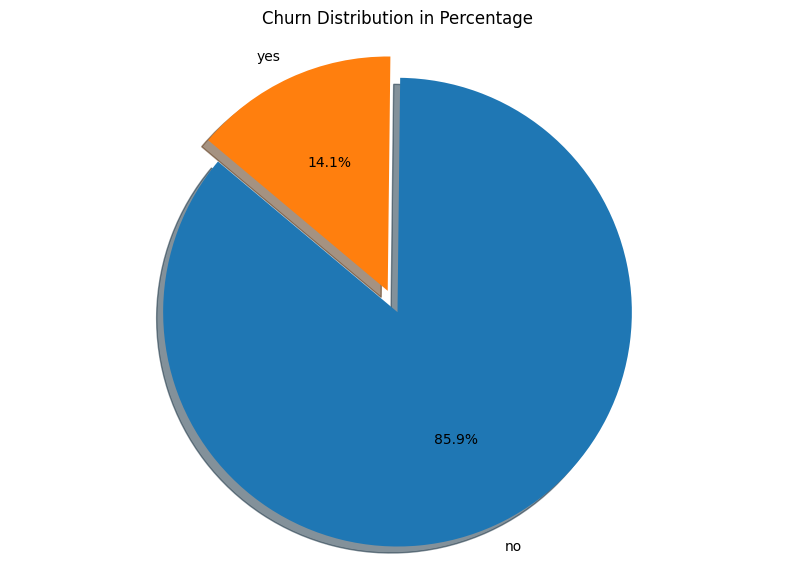

In [ ]:
import matplotlib.pyplot as plt

# Get the counts of each unique value in the 'churn' column
churn_counts = train_data['churn'].value_counts()

# Create a pie chart
labels = churn_counts.index
sizes = churn_counts.values
explode = (0.1, 0)  # explode the 1st slice ('True' in this case)

# Plot
plt.figure(figsize=(10, 7))
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Churn Distribution in Percentage")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()


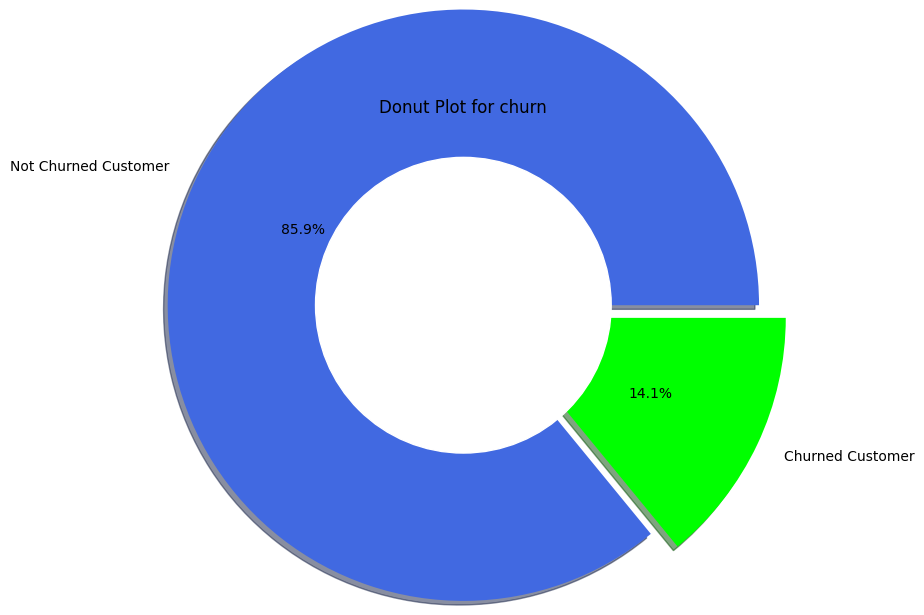

In [ ]:
#To get the Donut Plot to analyze churn
data = test_data['churn'].value_counts()
explode = (0, 0.2)
plt.pie(data, explode = explode,autopct='%1.1f%%',shadow=True,radius = 2.0, labels = ['Not Churned Customer','Churned Customer'],colors=['royalblue' ,'lime'])
circle = plt.Circle( (0,0), 1, color='white')
p=plt.gcf()
p.gca().add_artist(circle)
plt.title('Donut Plot for churn')
plt.show()

<Axes: xlabel='churn', ylabel='count'>

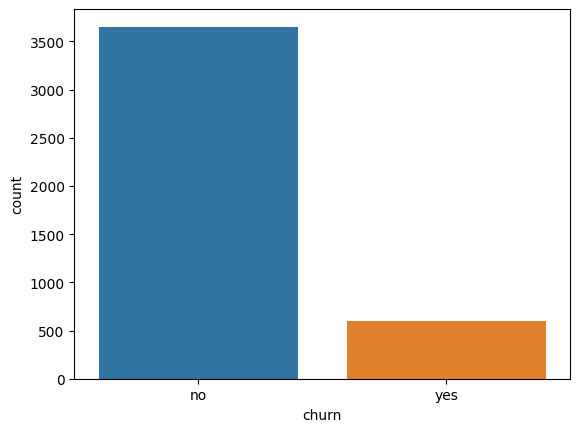

In [ ]:
#let's see churn by using countplot
sns.countplot(x=test_data.churn)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

# Make predictions on test data
y_pred = mlp.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9129411764705883


In [ ]:
train_data['churn'] = train_data['churn'].map({'yes': 1, 'no': 0})
test_data['churn'] = test_data['churn'].map({'yes': 1, 'no': 0})

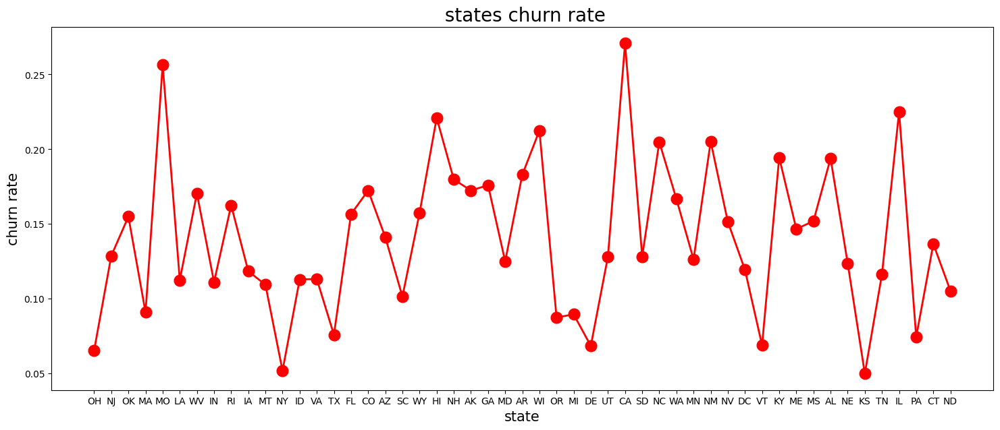

In [ ]:
s1=test_data['state'].unique()
s2=test_data.groupby(['state'])['churn'].mean()

plt.rcParams['figure.figsize'] = (18, 7)

plt.plot(s1,s2,color='r', marker='o', linewidth=2, markersize=12)

plt.title(" states churn rate", fontsize = 20)
plt.xlabel('state', fontsize = 15)
plt.ylabel('churn rate', fontsize = 15)
plt.show()

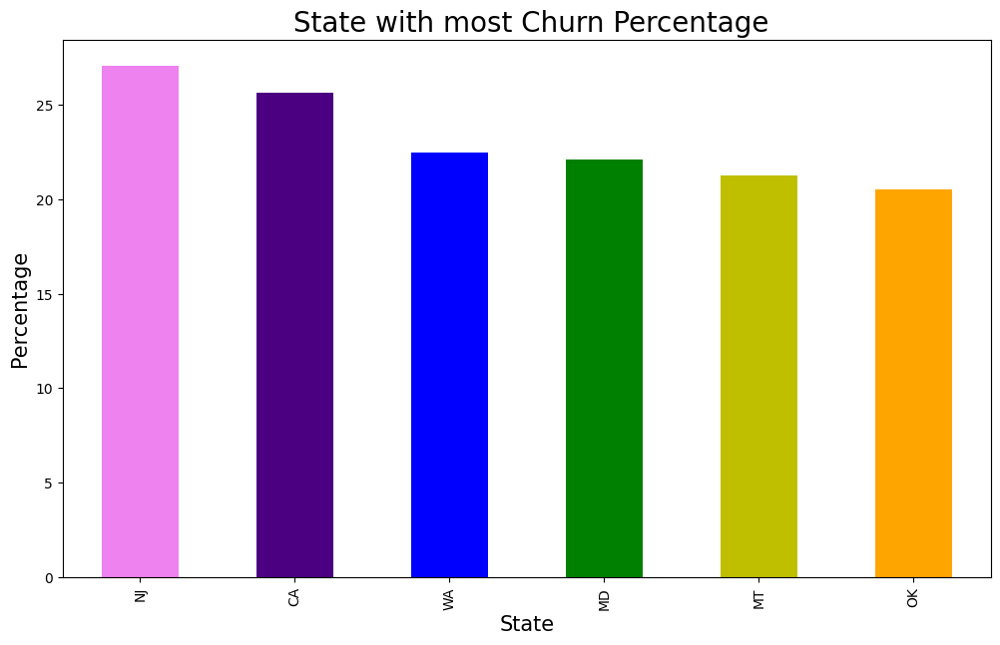

In [ ]:
plt.rcParams['figure.figsize'] = (12, 7)
color = plt.cm.copper(np.linspace(0, 0.5, 20))
((test_data.groupby(['state'])['churn'].mean())*100).sort_values(ascending = False).head(6).plot.bar(color = ['violet','indigo','b','g','y','orange','r'])
plt.title(" State with most Churn Percentage", fontsize = 20)
plt.xlabel('State', fontsize = 15)
plt.ylabel('Percentage', fontsize = 15)
plt.show()

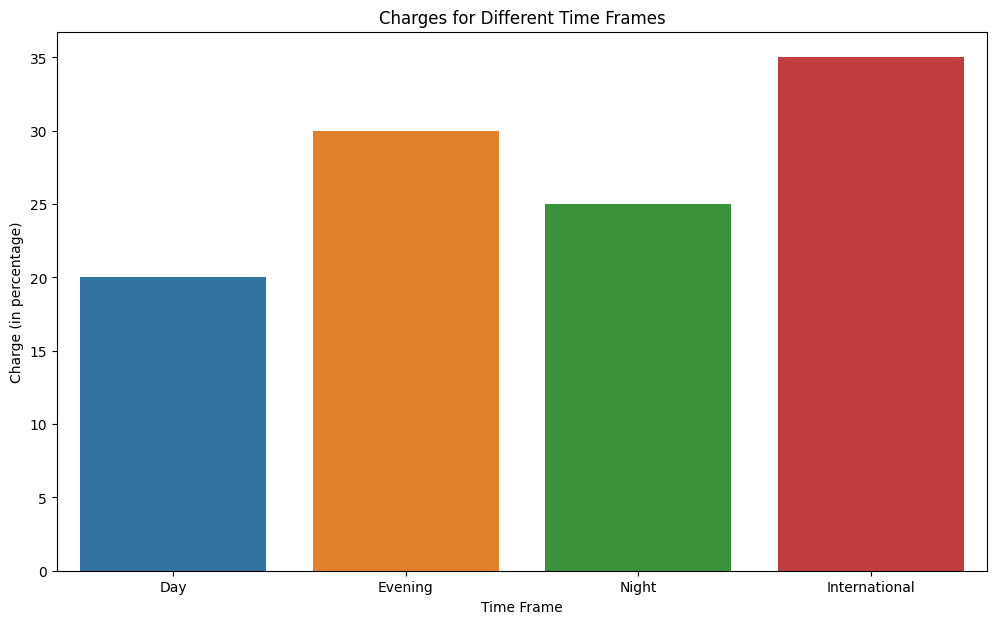

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

day_charge_perm = 20  # Replace with your actual value
eve_charge_perm = 30  # Replace with your actual value
night_charge_perm = 25  # Replace with your actual value
int_charge_perm = 35  # Replace with your actual value

sns.barplot(x=['Day','Evening','Night','International'],
            y=[day_charge_perm,eve_charge_perm,night_charge_perm,int_charge_perm])

plt.title("Charges for Different Time Frames")
plt.xlabel("Time Frame")
plt.ylabel("Charge (in percentage)")

plt.show()


Upon a thorough examination of the dataset, it becomes evident that factors such as the total duration of day, evening, and night calls, or their corresponding charges, do not appear to significantly influence the churn rate among customers. However, what stands out is the high cost associated with international calls. While this may seem like a given, considering the generally higher rates for international communication, it is noteworthy because it could be a determining factor for customers enrolled in international plans to consider leaving the service.






# **BIVARIATE ANALYSIS**

In the realm of Bivariate Analysis, we delve into the relationships between pairs of columns from the dataset, specifically focusing on those with numerical data types. Through this approach, we aim to uncover hidden patterns or correlations that may exist between two variables. To facilitate this exploration and make the insights visually interpretable, we employ graphical representations like **Box Plots** and **Scatter Plots**. These visualization techniques enable us to better understand the distribution, range, and potential outliers within the data, providing a more nuanced understanding of the variables in question.

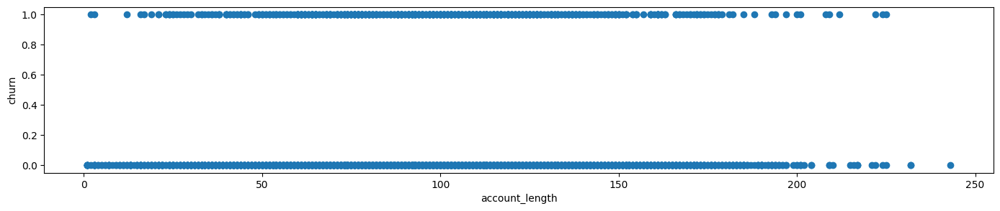

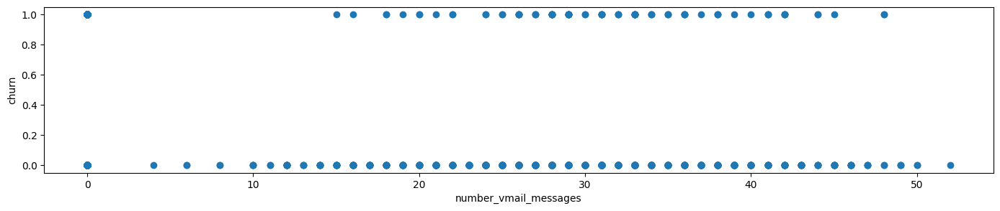

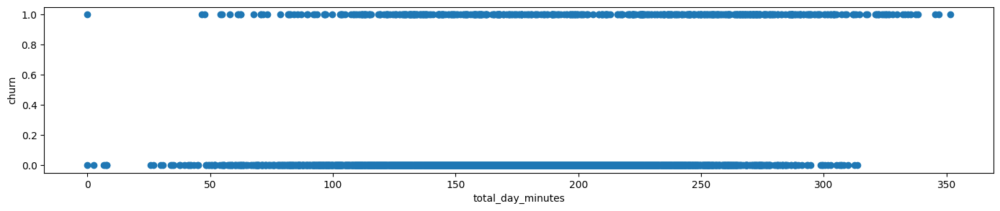

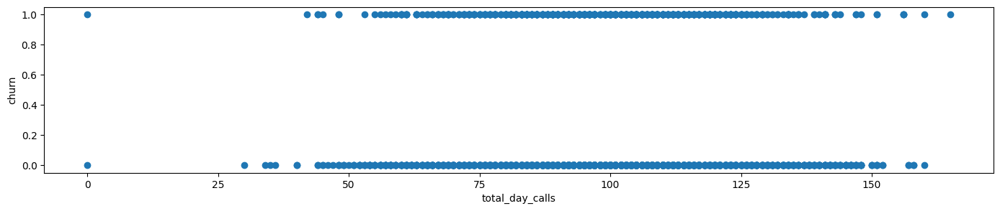

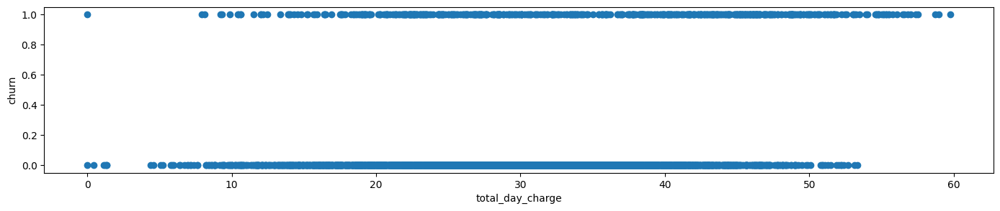

...

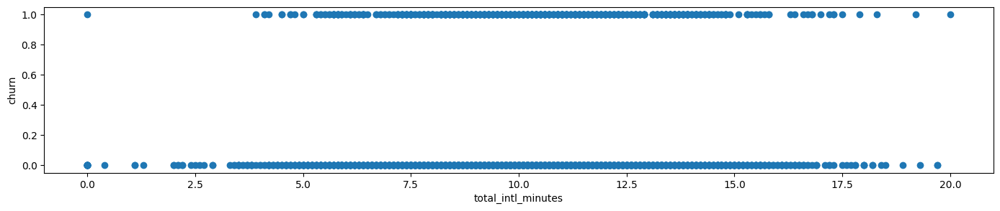

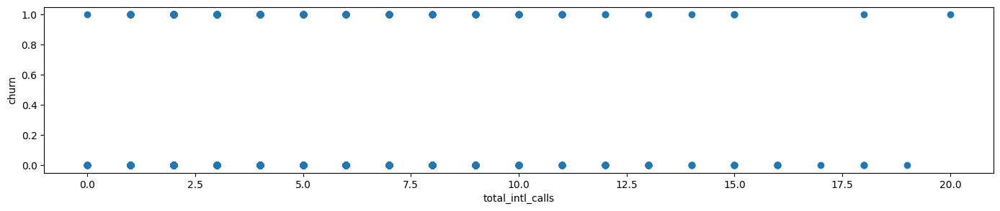

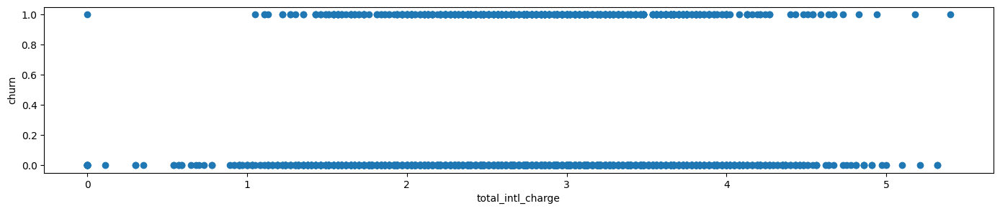

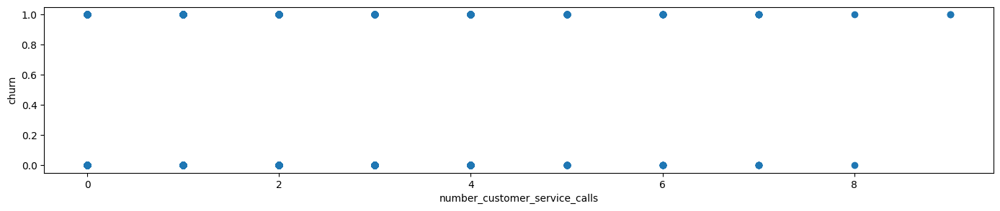

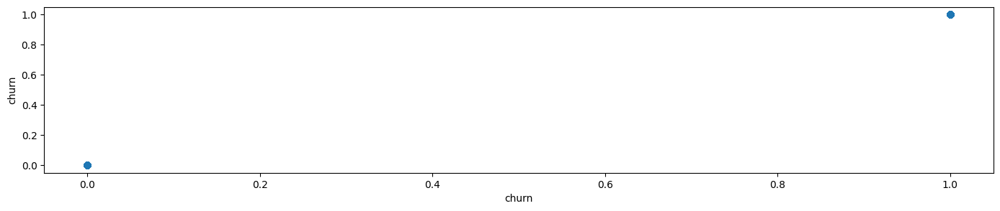

In [ ]:
# Plot a boxplot for churn column  by each numerical feature present in the data set
df2= test_data.describe().columns
for col in df2:
  fig=plt.figure(figsize=(17,3))
  ax=fig.gca()
  feature=test_data[col]
  label=test_data['churn']
  correlation= feature.corr(label)
  plt.scatter(x=feature,y=label)
  plt.xlabel(col)
  plt.ylabel('churn')
plt.show()

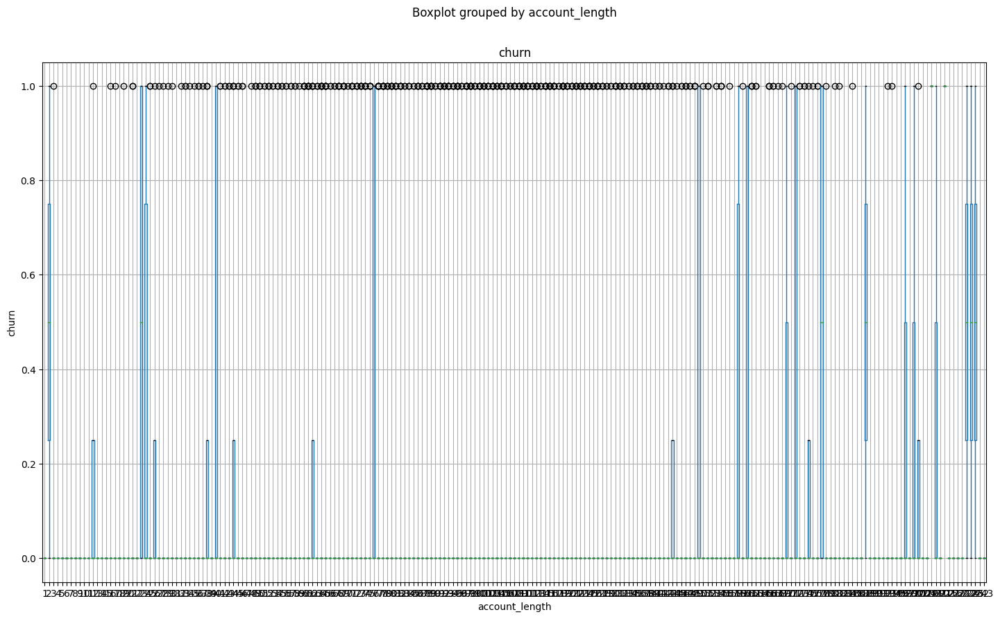

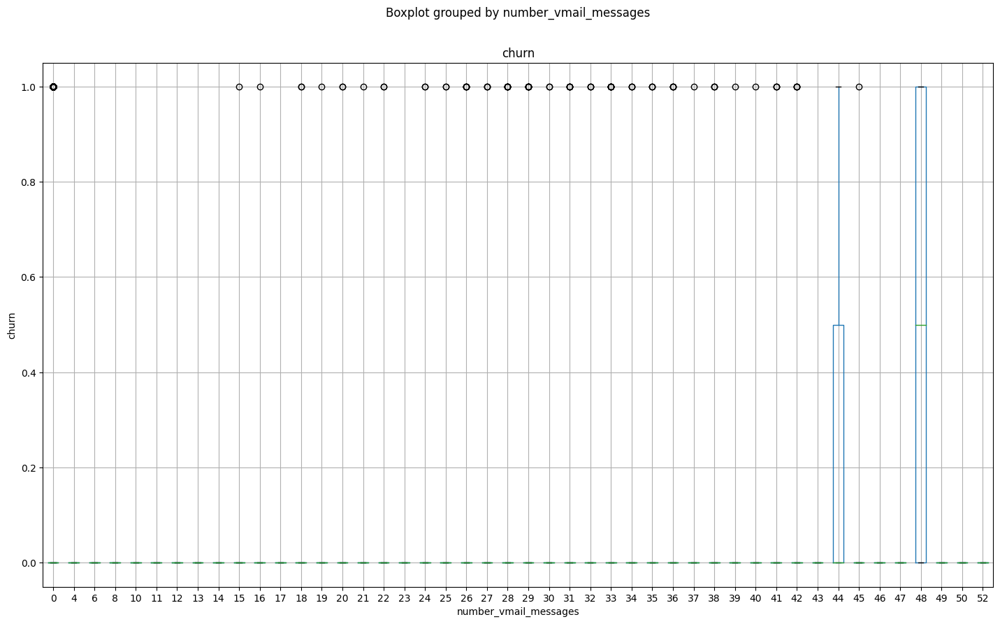

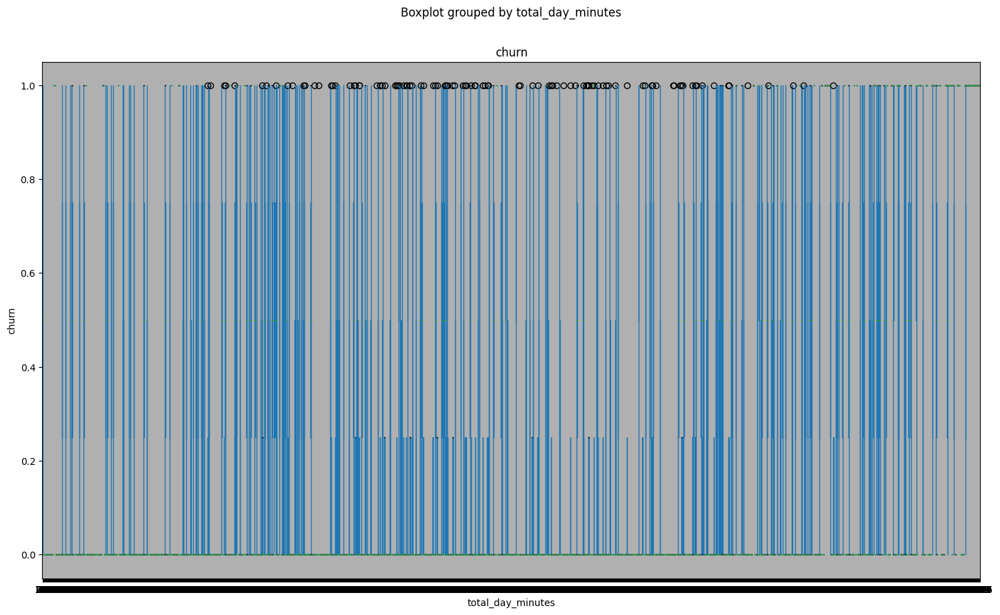

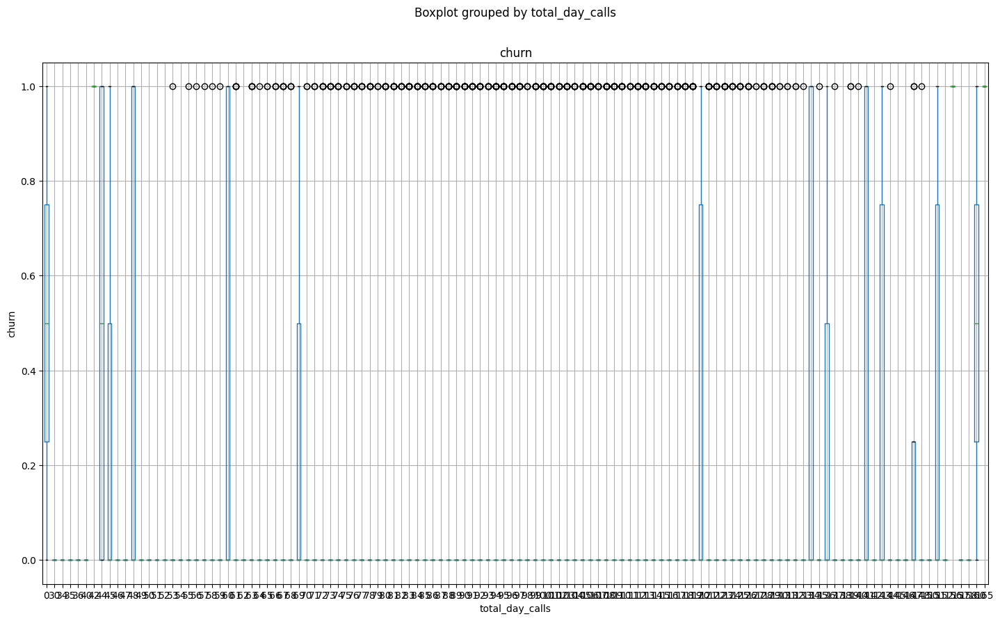

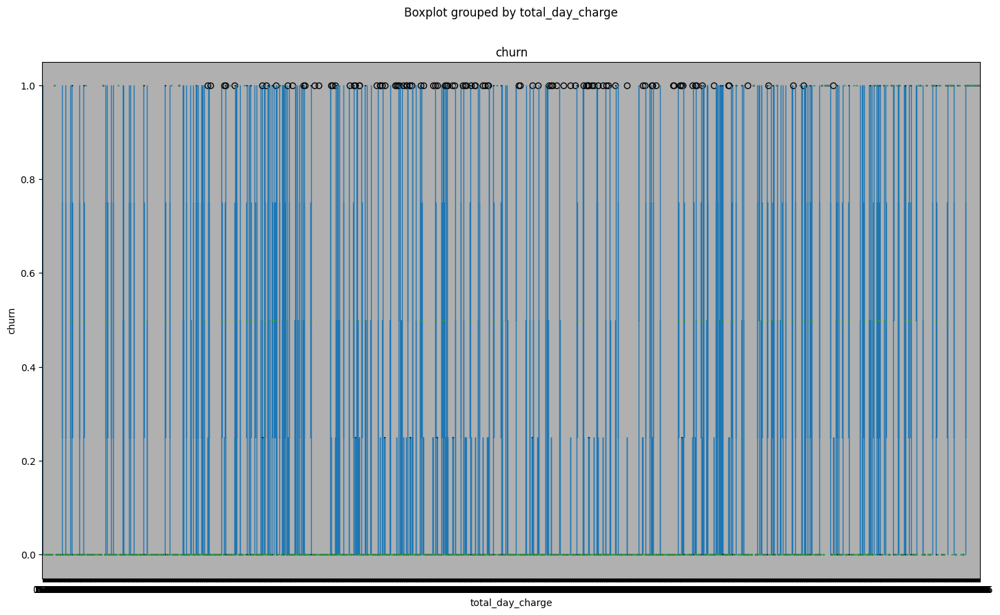

...

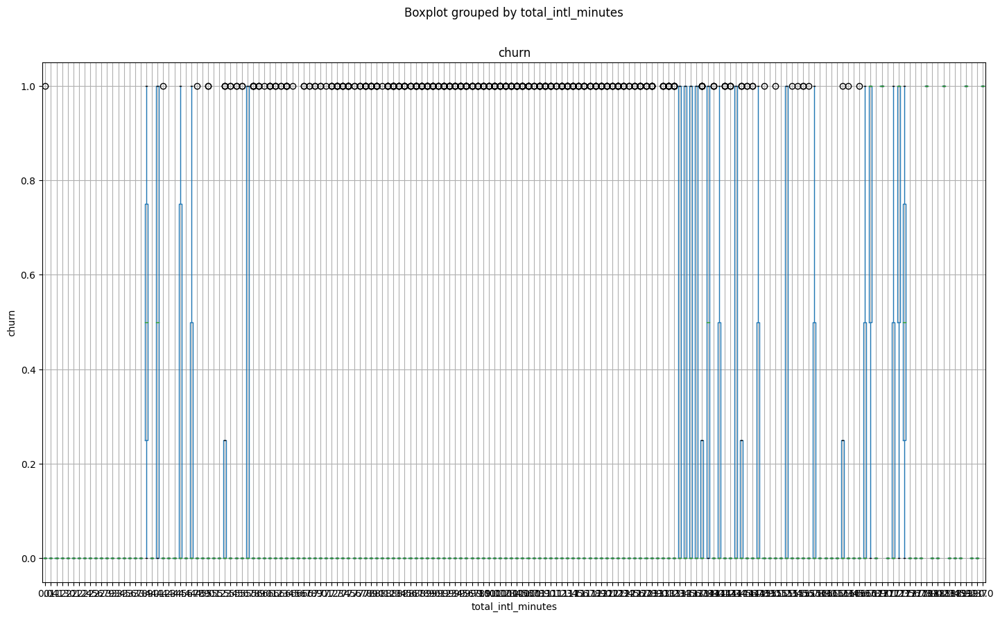

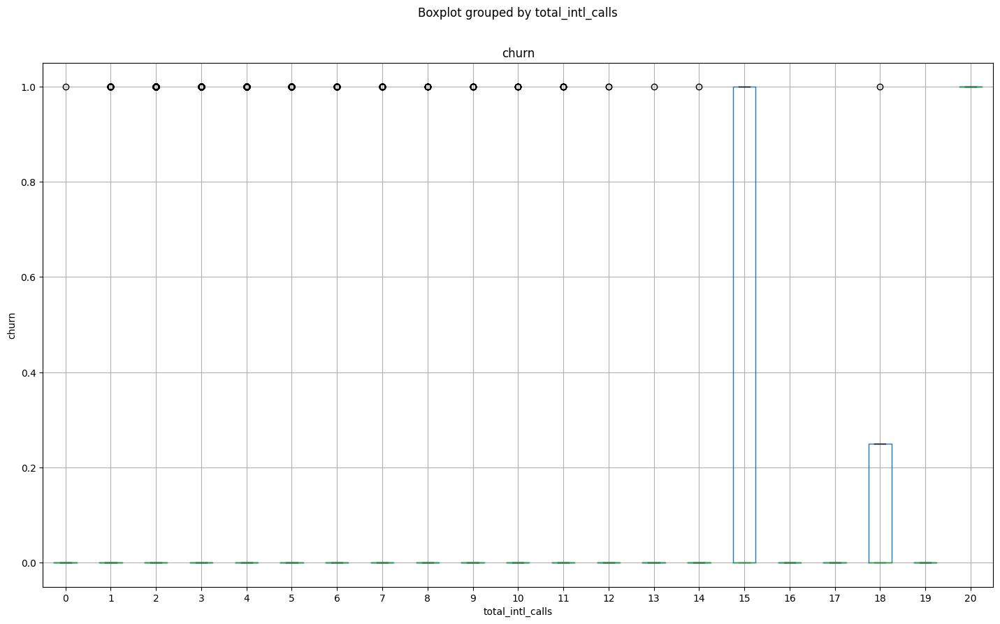

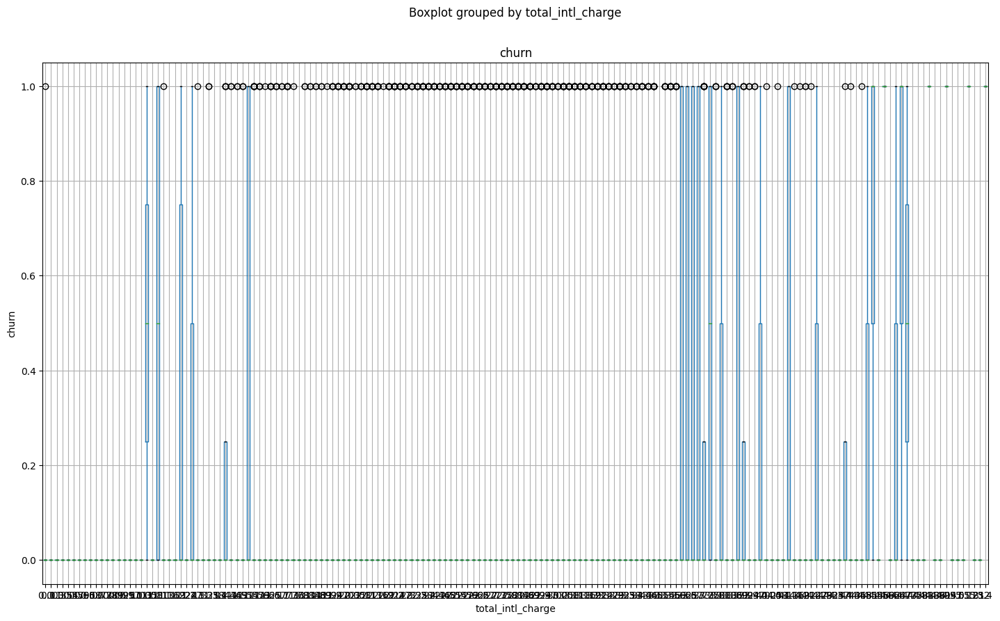

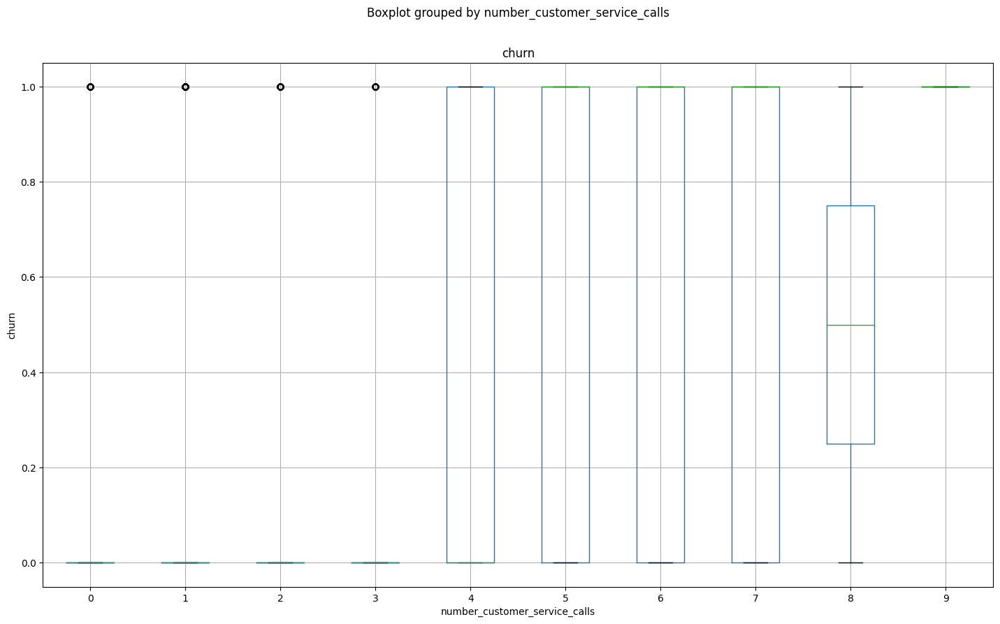

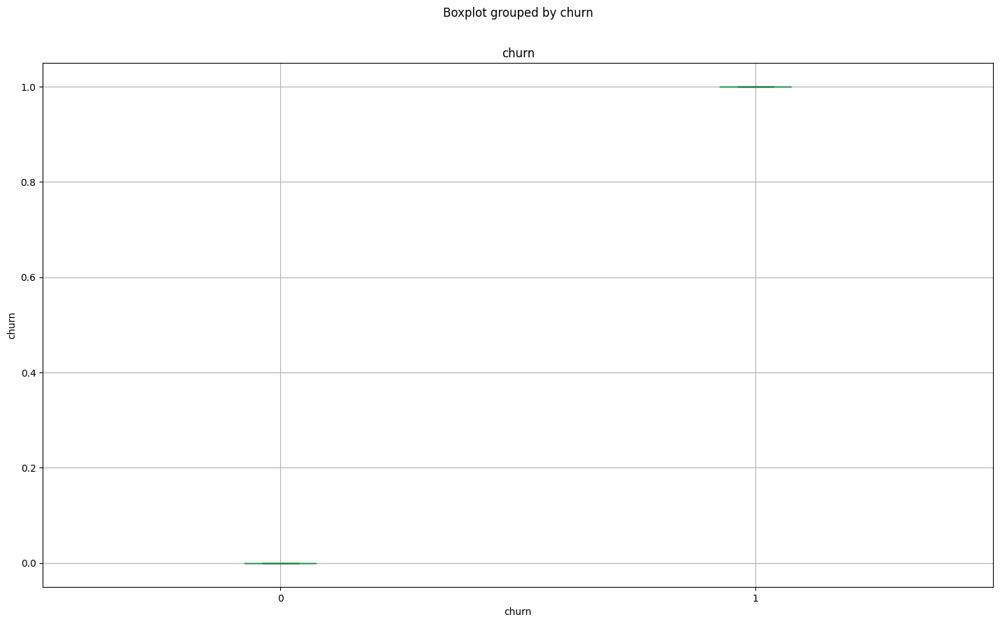

In [ ]:
#Plot the box plot for churn vs all numerical column
for col in df2:
  fig=plt.figure(figsize=(17,10))
  ax=fig.gca()
  #feature=telecom_df[col]
  #label=telecom_df['Churn']
  test_data.boxplot(column = 'churn', by = col, ax = ax)
  plt.xlabel(col)
  plt.ylabel('churn')
plt.show()

# **Multivariate Analysis**

In Multivariate Analysis, our exploration extends beyond the relationships between just two variables, encompassing instead multiple columns from the dataset. This allows us to gain a more comprehensive understanding of the intricate interactions and dependencies that may exist among several variables. To bring clarity to this complex landscape, we make use of various advanced visualization tools such as Correlation Plots, Correlation Matrices, Heatmaps, and Pair Plots.

Each of these visual representations serves a specific purpose in our analysis. For instance, Correlation Plots and Matrices provide a numerical measure to understand how variables correlate with each other, either positively or negatively. Heatmaps offer a color-coded graphical representation of these correlation values, making it easier to interpret the strength and direction of the relationships. Pair Plots, on the other hand, offer a grid of scatter plots for pairwise relationships and histograms for univariate distributions, which can be particularly useful for identifying trends and outliers across multiple dimensions.

By employing these techniques, we are better equipped to identify complex structures in the data, which can be crucial for predictive modeling and decision-making processes.

<ipython-input-51-a25048341c0d>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  test_data.corr()['churn'].sort_values(ascending = False).plot(kind='bar',color = ['red','blue','yellow','indigo','orange','brown','pink'])


<Axes: >

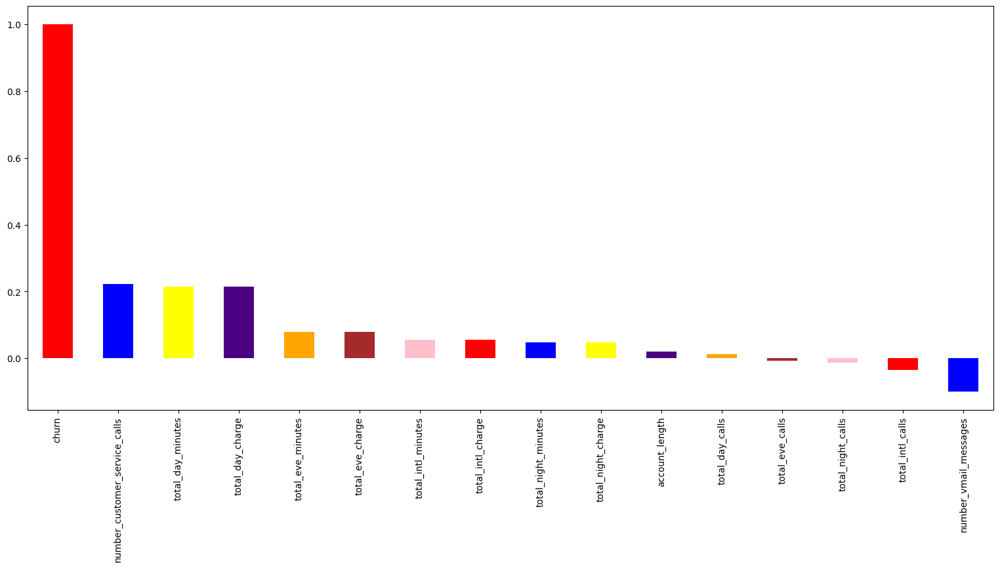

In [ ]:
# visualization using correlation plot
plt.figure(figsize=(19,8))
test_data.corr()['churn'].sort_values(ascending = False).plot(kind='bar',color = ['red','blue','yellow','indigo','orange','brown','pink'])

<ipython-input-52-af69990acabc>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation=test_data.corr()


<Axes: >

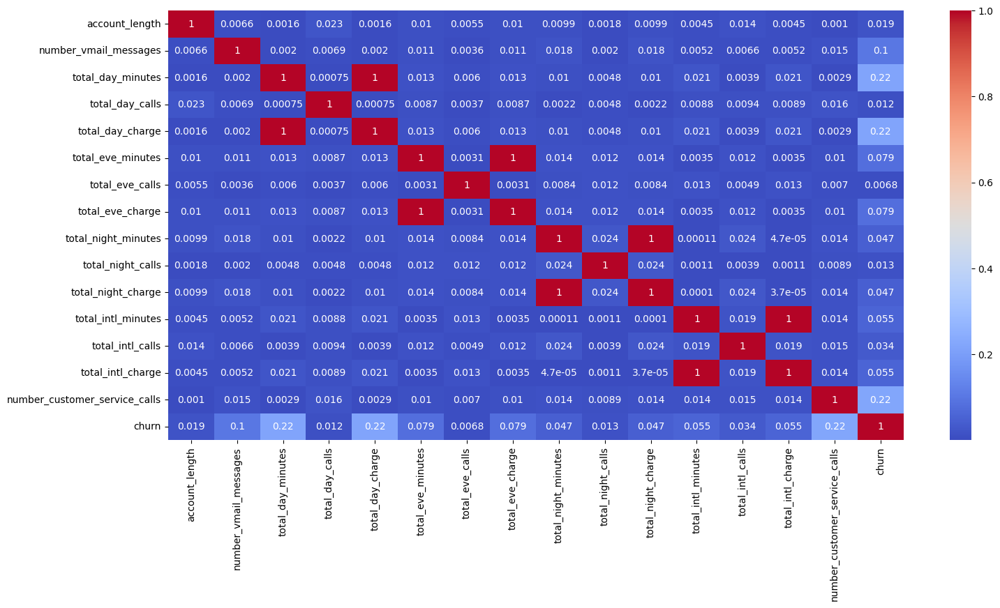

In [ ]:
## plot the Correlation matrix
plt.figure(figsize=(17,8))
correlation=test_data.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

<ipython-input-53-79cf7fd8a5e1>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(test_data.corr(), cmap="Paired",annot=False)


Text(0.5, 1.0, 'Correlation Heatmap')

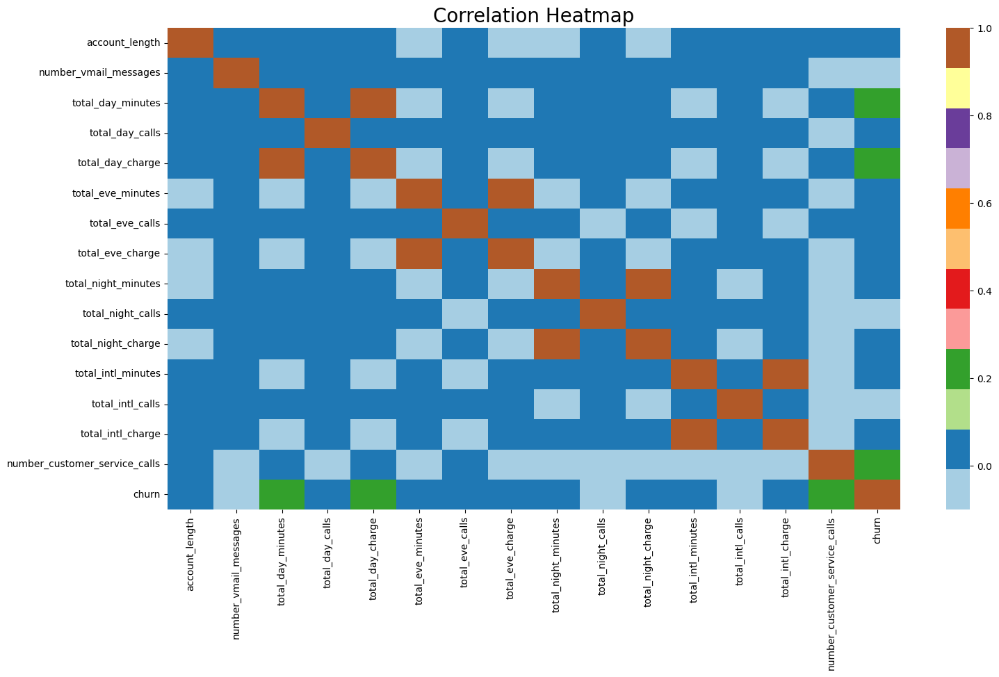

In [ ]:
#create a correlation heatmap
#Assigning true=1 and False=0 to churn variable
test_data['churn'] = test_data['churn'].replace({bool(True):1,bool(False):0})
plt.figure(figsize=(17,9))
sns.heatmap(test_data.corr(), cmap="Paired",annot=False)
plt.title("Correlation Heatmap", fontsize=20)

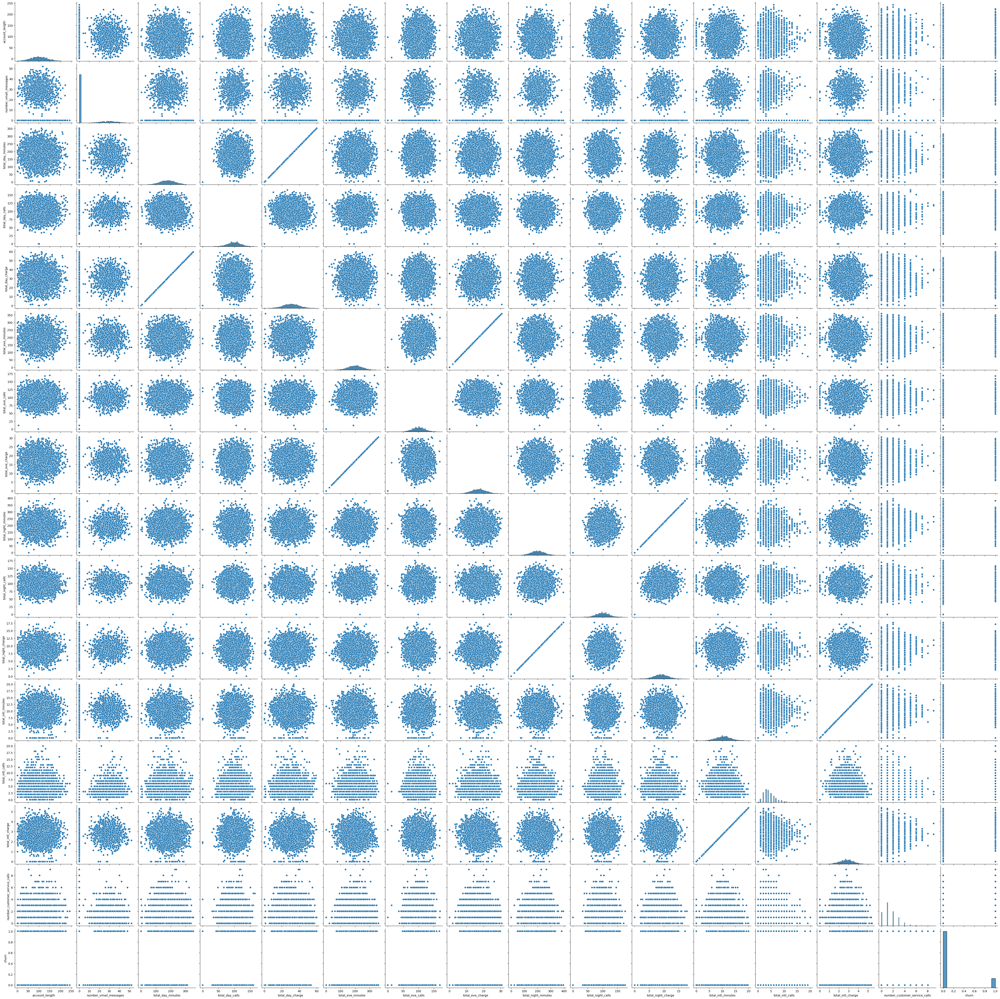

In [ ]:
#plot the pair plot for all coloumn
sns.pairplot(test_data, height=3)

# **Conclusion**
After conducting an in-depth Exploratory Data Analysis (EDA) on our dataset, we've arrived at several important insights that shed light on the factors influencing customer churn. Here's a summary of our key findings:

1. **Geographic Disparities:** Certain states exhibit a notably higher rate of customer churn, potentially due to issues like poor network coverage in those areas.

2. **Redundant Features:** Variables such as 'Area Code' and 'Account Length' seem to have no discernible impact on churn rates, suggesting that they can be considered as redundant features for our predictive model.

3. **International Plan Woes:** Customers enrolled in an International Plan are more likely to churn. One contributing factor appears to be the higher costs associated with international calls, coupled with potential network issues.

4. **Voice Mail Quality Concerns:** It appears that if a customer accumulates more than 20 voice mail messages, the likelihood of churn increases, which may point to issues regarding the quality or functionality of the voice mail service.

5. **Inconsequential Features:** Several variables including 'Total Day Minutes,' 'Total Day Calls,' 'Total Day Charge,' 'Total Eve Minutes,' 'Total Eve Calls,' 'Total Eve Charge,' 'Total Night Minutes,' 'Total Night Calls,' and 'Total Night Charge' do not seem to be influential factors for churn.

6. **International Call Challenges:** The data suggests that customers who opt for the International Plan experience a higher churn rate. This might be due to elevated costs or sub-par call quality on international calls.

7. **Customer Service Inefficacies:** It appears that instances of churn rise significantly when customers who are already unsatisfied have unproductive interactions with customer service centers, implying that customer issues are not being effectively resolved.

These insights offer valuable direction for refining our predictive model, as well as formulating targeted retention strategies to mitigate customer churn.







# **Recommedations**

**Enhanced Strategies to Mitigate Customer Churn**

1. **Addressing Geographic Coverage Gaps:** Prioritize network enhancements in states with higher churn rates to provide a more reliable service experience, thereby improving customer retention.

2. **International Plan Incentives:** Offer discounted or tiered pricing structures for international calling to incentivize customer loyalty and offset high call costs. Additionally, consider promotional packages that bundle international minutes at a lower rate.

3. **Voice Mail Service Quality:** Invest in improving the audio quality and user interface of voice mail services. Implement a feedback system where customers can rate their voice mail experience, allowing for data-driven improvements.

4. **Revamping Customer Service Operations:** Elevate the quality of customer service interactions by providing robust training programs for service representatives. Implement a system to regularly gather customer feedback post-interaction to identify areas of improvement. Aim to resolve customer issues swiftly and effectively.

By adopting these targeted strategies, telecom operators have the opportunity to substantially reduce churn and improve overall customer satisfaction.